In [ ]:
 audio = 16000

# Setup

In [ ]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fluidsynth is already the newest version (1.1.9-1).
The following packages were automatically installed and are no longer required:
  libnvidia-common-460 nsight-compute-2020.2.0
Use 'sudo apt autoremove' to remove them.
0 upgraded, 0 newly installed, 0 to remove and 42 not upgraded.


In [ ]:
!pip install --upgrade pyfluidsynth

In [ ]:
!pip install pretty_midi

# Setup

In [ ]:
import collections
import datetime
import fluidsynth
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf

from IPython import display
from matplotlib import pyplot as plt
from typing import Dict, List, Optional, Sequence, Tuple


# Download Dataset

In [ ]:
data_dir = pathlib.Path('data/maestro-v2.0.0')
if not data_dir.exists():
  tf.keras.utils.get_file(
      'maestro-v2.0.0-midi.zip',
      origin='https://storage.googleapis.com/magentadata/datasets/maestro/v2.0.0/maestro-v2.0.0-midi.zip',
      extract=True,
      cache_dir='.', cache_subdir='data',
  )

In [ ]:
data = glob.glob(str(data_dir/'**/*.mid*'))
print('Number of files:', len(data))

Number of files: 1282


# MIDI Processing

In [ ]:
# check tempo and Time signature 120 4/4

for d in data[:5]:
    pm = pretty_midi.PrettyMIDI(d)
    b = pm.time_signature_changes
    a = pm.get_tempo_changes()
    print(a,b)

(array([0.]), array([120.])) [TimeSignature(numerator=4, denominator=4, time=0.0)]
(array([0.]), array([120.])) [TimeSignature(numerator=4, denominator=4, time=0.0)]
(array([0.]), array([120.])) [TimeSignature(numerator=4, denominator=4, time=0.0)]
(array([0.]), array([120.])) [TimeSignature(numerator=4, denominator=4, time=0.0)]
(array([0.]), array([120.])) [TimeSignature(numerator=4, denominator=4, time=0.0)]


In [ ]:
sample_file = data[1]
print(sample_file)

data/maestro-v2.0.0/2004/MIDI-Unprocessed_XP_19_R2_2004_01_ORIG_MID--AUDIO_19_R2_2004_03_Track03_wav.midi


In [ ]:
pm = pretty_midi.PrettyMIDI(sample_file)
b = pm.time_signature_changes
a = pm.get_tempo_changes()
print(a,b)

(array([0.]), array([120.])) [TimeSignature(numerator=4, denominator=4, time=0.0)]


In [ ]:
def display_audio(pm: pretty_midi.PrettyMIDI, seconds=300):
  waveform = pm.fluidsynth(fs=audio)
  # Take a sample of the generated waveform to mitigate kernel resets
  waveform_short = waveform[:seconds*audio]
  return display.Audio(waveform_short, rate=audio)

In [ ]:
print('Number of instruments:', len(pm.instruments))
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Number of instruments: 1
Instrument name: Acoustic Grand Piano


# Visualize

In [ ]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
    pm = pretty_midi.PrettyMIDI(midi_file)
    instrument = pm.instruments[0]
    notes = collections.defaultdict(list)

    # Sort the notes by start time
    sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
    prev_start = sorted_notes[0].start

    for note in sorted_notes:
        start = note.start
        end = note.end
        notes['pitch'].append(note.pitch)
        notes['start'].append(start)
        notes['end'].append(end)
        notes['step'].append(start - prev_start)
        notes['duration'].append(end - start)
        prev_start = start

    return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [ ]:
raw_noteseed = midi_to_notes(sample_file)
raw_noteseed

,pitch,start,end,step,duration
0,75,1.037500,1.390625,0.000000,0.353125
1,63,1.073958,1.209375,0.036458,0.135417
2,48,1.091667,1.361458,0.017708,0.269792
3,55,1.323958,1.473958,0.232292,0.150000
4,77,1.481250,1.581250,0.157292,0.100000
...,...,...,...,...,...
8977,36,704.971875,705.069792,0.004167,0.097917
8978,79,704.971875,705.427083,0.000000,0.455208
8979,39,704.973958,705.109375,0.002083,0.135417
8980,43,704.978125,705.114583,0.004167,0.136458


# Ploting Note

In [ ]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
    if count:
        title = f'First {count} notes'
    else:
        title = f'Whole track'
        count = len(notes['pitch'])
    plt.figure(figsize=(20, 4))
    plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
    plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
    plt.plot(
        plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
    plt.xlabel('Time [s]')
    plt.ylabel('Pitch')
    _ = plt.title(title)

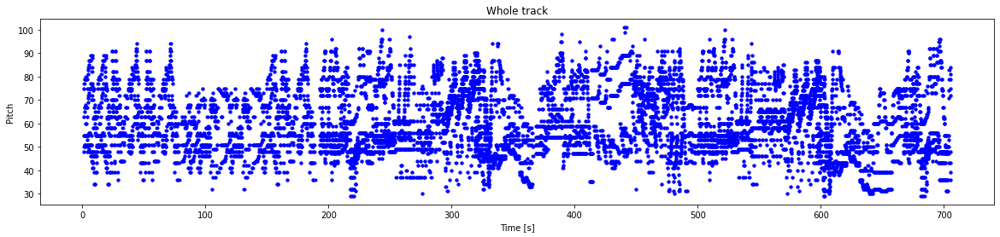

In [ ]:
plot_piano_roll(raw_noteseed)

In [ ]:
get_note_names = np.vectorize(pretty_midi.note_number_to_name)
sample_note_names = get_note_names(raw_noteseed['pitch'])
sample_note_names[:100]

array(['D#5', 'D#4', 'C3', 'G3', 'F5', 'D3', 'F4', 'G3', 'G5', 'D#3',
       'G4', 'G3', 'G5', 'D#3', 'G4', 'G3', 'C4', 'G3', 'G#5', 'D3',
       'G#4', 'G3', 'G5', 'D#3', 'G4', 'G3', 'C4', 'G3', 'D#5', 'D#4',
       'C3', 'G3', 'G5', 'G4', 'F3', 'G3', 'A5', 'D#3', 'A4', 'G3', 'B5',
       'B4', 'D3', 'G3', 'C6', 'D#3', 'C5', 'G#3', 'C#6', 'C#3', 'C#5',
       'G#3', 'D#6', 'C3', 'D#5', 'G#3', 'D#6', 'D#5', 'C3', 'D#3', 'G#3',
       'D#3', 'F6', 'C3', 'F5', 'D#3', 'D#6', 'A#2', 'D#5', 'D#3', 'G3',
       'D#3', 'A#5', 'A#2', 'A#4', 'D#3', 'C6', 'G#2', 'C5', 'C3', 'E6',
       'G2', 'E5', 'C3', 'F2', 'F5', 'F6', 'C3', 'G2', 'A#4', 'A#3',
       'A#2', 'D5', 'D4', 'F2', 'A#2', 'D#2', 'D#5', 'D#4', 'A#2'],
      dtype='<U3')

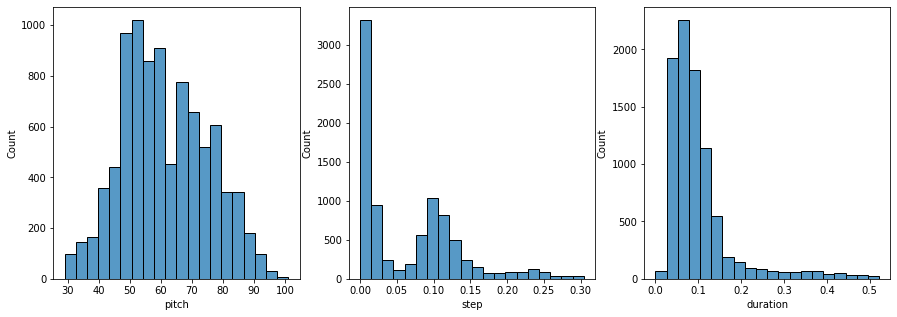

In [ ]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
    plt.figure(figsize=[15, 5])
    plt.subplot(1, 3, 1)
    sns.histplot(notes, x="pitch", bins=20)

    plt.subplot(1, 3, 2)
    max_step = np.percentile(notes['step'], 100 - drop_percentile)
    sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))
    
    plt.subplot(1, 3, 3)
    max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
    sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))

plot_distributions(raw_noteseed)

# Network

In [ ]:
class Layer:
    def __init__(self):
        self.input = None
        self.output = None

    # computes the output Y of a layer for a given input X
    def forward_propagation(self, input):
        raise NotImplementedError

    # computes dE/dX for a given dE/dY (and update parameters if any)
    def backward_propagation(self, output_error, learning_rate):
        raise NotImplementedError

In [ ]:
class FCLayer(Layer):
    def __repr__(self):
        return ' FCLayer use %d in and %d out' % (self.input_size,self.output_size)

    # input_size = number of input neurons
    # output_size = number of output neurons
    def __init__(self, input_size, output_size):
        self.input_size = input_size
        self.output_size = output_size
        self.weights = np.random.rand(input_size, output_size) - 0.5
        self.bias = np.random.rand(1, output_size) - 0.5

    # returns output for a given input
    def forward_propagation(self, input_data):
        self.input = input_data
        self.output = np.dot(self.input, self.weights)
        return self.output

    # computes dE/dW, dE/dB for a given output_error=dE/dY. Returns input_error=dE/dX.
    def backward_propagation(self, output_error, learning_rate):
        # print("FCLayer backward_propagation",self.input.T.shape, output_error.shape)
        # input_error = np.dot(output_error, self.weights)
        # input_error = np.dot(output_error, self.weights.T)
        input_error = np.dot(output_error, self.weights.T)
        weights_error = np.dot(self.input.T, output_error)
        # dBias = output_error

        # update parameters
        self.weights -= learning_rate * weights_error
        self.bias -= learning_rate * output_error
        return input_error

In [ ]:
# inherit from base class Layer
class ActivationLayer(Layer):
    def __repr__(self):
        return ' ActivationLayer use %s' % (self.activation)

    def __init__(self, activation, activation_prime):
        self.activation = activation
        self.activation_prime = activation_prime

    # returns the activated input
    def forward_propagation(self, input_data):
        self.input = input_data
        self.output = self.activation(self.input)
        return self.output

    # Returns input_error=dE/dX for a given output_error=dE/dY.
    # learning_rate is not used because there is no "learnable" parameters.
    def backward_propagation(self, output_error, learning_rate):
        return self.activation_prime(self.input) * output_error

In [ ]:
# activation function and its derivative
def tanh(x):
    return np.tanh(x);

def tanh_prime(x):
    return 1-np.tanh(x)**2;

In [ ]:
# loss function and its derivative
def mse(y_true, y_pred):
    return np.mean(np.power(y_true-y_pred, 2));

def mse_prime(y_true, y_pred):
    # return 2*(y_pred-y_true)/y_true.size;
    return 2*(y_pred-y_true);

In [ ]:
# cross entropy loss function
def cross_entropy(y_true,y_pred):
    loss=-np.sum(y_true*np.log(y_pred))
    return loss/float(y_pred.shape[0])
def cross_entropy_prime(y_true,y_pred):
    return np.array(y_pred-y_true)

In [ ]:
def softmax(x):
    s = np.exp(x)
    return s / s.sum()
def softmax_prime(x):                                         
    s = np.exp(x)
    ds = s * np.identity(s.size) - s.transpose()
    return ds

In [ ]:
def sigmoid(x):
    s=1/(1+np.exp(-x))
    return s
def sigmoid_prime(x):
    s=1/(1+np.exp(-x))
    ds=s*(1-s)  
    return ds

In [ ]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

# One Hot Nahh man

In [ ]:
# Hot key format
songg = midi_to_notes(data[0])
pitchSongg =  (songg['pitch'])
hotPitch = np.zeros((len(pitchSongg), 128))
hotPitch[np.arange(pitchSongg.size),pitchSongg] = 1
#len(b[0])
values, counts = np.unique(hotPitch, return_counts=True)
#pitchSongg

print(hotPitch[1])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
songg = midi_to_notes(data[0])
pitchSongg =  (songg['pitch'])
hotPitch = np.zeros((len(pitchSongg), 128))
hotPitch[np.arange(pitchSongg.size),pitchSongg] = 1
pitchSonggg = np.array(hotPitch)
pitchSonggg

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str, 
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm

# NetHotwork not work

In [ ]:
class NetHot2work:
    def __init__(self):
        self.nseed = 32
        self.Players = []
        self.Slayers = []
        self.Dlayers = []
        self.loss = None
        self.loss_prime = None
        self._add()

        self.MNote = []
        self.MStep = []
        self.MDura = []

        self.LNote = []
        self.LStep = []
        self.LDura = []

    # add layer to network
    def _add(self):
        nl = 10
        ac = ActivationLayer(tanh, tanh_prime)
        self.Players.append(FCLayer(self.nseed*128, 128))
        self.Slayers.append(FCLayer(self.nseed, 128))
        self.Dlayers.append(FCLayer(self.nseed, 128))
        print(self.Players[0].weights.shape)

        self.Players.append(ac)
        self.Slayers.append(ac)
        self.Dlayers.append(ac)

        for i in range(nl):
            print(i)
            self.Players.append(FCLayer(128, 128))
            self.Slayers.append(FCLayer(128, 128))
            self.Dlayers.append(FCLayer(128, 128))
            self.Players.append(ac)
            self.Slayers.append(ac)
            self.Dlayers.append(ac)
        self.Players.append(FCLayer(128, 128))
        self.Slayers.append(FCLayer(128, 1))
        self.Dlayers.append(FCLayer(128, 1))

        self.Players.append(ac)
        self.Slayers.append(ac)
        self.Dlayers.append(ac)

    def use(self, loss, loss_prime):
        self.loss = loss
        self.loss_prime = loss_prime

    def predict(self, seed=0, nNote=1):
        print("enter predict")
        
        mSeed = data[seed]
        mpSeed = midi_to_notes(mSeed)

        pitchSongg =  np.array(mpSeed['pitch'])
        hotPitch = np.zeros((len(pitchSongg), 128))
        hotPitch[np.arange(pitchSongg.size),pitchSongg] = 1
        hotPitches = []
        for i in range(len(hotPitch)):
            hotPitches.extend(hotPitch[i])

        pitchSonggg = np.array(hotPitches)

        stepSongg =  np.array(mpSeed['step']/5 -1)

        duraSongg =  np.array(mpSeed['duration']/5 -1)

        outTNote = [pitchSonggg[:self.nseed*128]]
        outTStep = [stepSongg[:self.nseed]]
        outTDura = [duraSongg[:self.nseed]]
        print(nNote)
        # print("outTnote: ", len(outTNote[0]))

        for j in range(nNote):
            print(j)

            outRNote = outTNote[0][j*128:((j+self.nseed)*128)]
            outRStep = outTStep[0][j:j+self.nseed]
            outRDura = outTDura[0][j:j+self.nseed]

            print("outRNote start loop: ", len(outRNote))
            for layer in self.Players:
                outRNote = layer.forward_propagation(outRNote)
            for layer in self.Slayers:
                outRStep = layer.forward_propagation(outRStep)
            for layer in self.Dlayers:
                outRDura = layer.forward_propagation(outRDura)
            print("outRnote after lay: ", len(outRNote))
            print("outTnote after lay: ", len(outTNote[0]))
            outTNote = [np.append(outTNote[0], outRNote)]
            outTStep = [np.append(outTStep[0], outRStep[0])]
            outTDura = [np.append(outTDura[0], outRDura[0])]
            print("outTatalst: ",len(outTNote[0]))
            print("outRatalst: ", len(outRNote))

        print('finish')
        print(outTNote)
        print(outTStep)
        print(outTDura)
        return outTNote, outTStep, outTDura

    # train the network
    def fit(self):
        useData = data[:5]
        learning_rate = 0.000001
        epochs = 5
        for k in range(epochs):
            errNote = 0
            errStep = 0
            errDura = 0

            for s in useData:

                songg = midi_to_notes(s)
                n = len(songg)-50

                pitchSongg =  np.array(songg['pitch'])
                hotPitch = np.zeros((len(pitchSongg), 128))
                hotPitch[np.arange(pitchSongg.size),pitchSongg] = 1
                hotPitches = []
                for i in range(len(hotPitch)):
                    hotPitches.extend(hotPitch[i])

                pitchSonggg = np.array(hotPitches)

                stepSongg =  songg['step']/5 - 1

                duraSongg =  songg['duration']/5 - 1

                for j in range(n):
                    outNote = np.array([pitchSonggg[j*128:(j+self.nseed)*128]])
                    trueNote = np.array([pitchSonggg[((j+self.nseed)*128)-128:(j+self.nseed)*128]])
                    # print("outnote: ", len(outNote[0]))
                    # print("truenote: ", len(trueNote[0]))

                    outStep = np.array([stepSongg[j:j+self.nseed]])
                    trueStep = np.array(stepSongg[j+self.nseed])

                    outDura = np.array([duraSongg[j:j+self.nseed]])
                    trueDura = np.array(duraSongg[j+self.nseed])

                    for layer in self.Players:
                        outNote = layer.forward_propagation(outNote)
                    for layer in self.Slayers:
                        outStep = layer.forward_propagation(outStep)
                    for layer in self.Dlayers:
                        outDura = layer.forward_propagation(outDura)

                   # print("outnote: ", len(outNote[0]))
                    # ## แปลงกลับคิด loss
                    # numTPitch = round(len(trueNote)/128)
                    # numOPitch = round(len(outNote[0])/128)
                    # trueNo = []
                    # outNo = []
                    # for i in range(numTPitch):
                    #     trueNo.append(np.where(pitchSonggg[i*128:(i+1)*128] == np.amax(pitchSonggg[i*128:(i+1)*128])))
                    # trueNoteR = np.concatenate((trueNo[:len(trueNo)]), axis=None)
                    # for i in range(numOPitch):    
                    #     outNo.append(np.where(outNote[0][i*128:(i+1)*128] == np.amax(outNote[0][i*128:(i+1)*128])))
                    # outNoteR = np.concatenate((outNo[:len(outNo)]), axis=None)
                    # print('Out note rework:', outNoteR)
                    # print('True note rework:', trueNoteR)
                    # ###

                    self.MNote.append(self.loss(trueNote, outNote))
                    self.MStep.append(self.loss(trueStep, outStep))
                    self.MDura.append(self.loss(trueDura, outDura))

                    errNote += self.loss(trueNote, outNote)
                    errStep += self.loss(trueStep, outStep)
                    errDura += self.loss(trueDura, outDura)
                    # print('epoch %d/%d   trueNote=%f, outNote=%f' % (j+1, n, trueNote, outNote))
                    
                    # backward propagation
                    errorNote = self.loss_prime(trueNote, outNote)
                    errorStep = self.loss_prime(trueStep, outStep)
                    errorDura = self.loss_prime(trueDura, outDura)

                    #print(errorNote)
                    #print('Trained %d/%d ' % (j,i+1))

                    for layer in reversed(self.Players):
                        errorNote = layer.backward_propagation(errorNote, learning_rate)
                    for layer in reversed(self.Slayers):
                        errorStep = layer.backward_propagation(errorStep, learning_rate)
                    for layer in reversed(self.Dlayers):
                        errorDura = layer.backward_propagation(errorDura, learning_rate)

            errNote /= n
            errStep /= n
            errDura /= n
            self.LNote.append(errNote)
            self.LStep.append(errStep)
            self.LDura.append(errDura)
            print('Note %d/%d   errorNote=%f, errorStep=%f, errorDura=%f' % (k+1, epochs, errNote, errStep, errDura))

In [ ]:
nnNotHot = NetHot2work()

(4096, 128)
0
1
2
3
4
5
6
7
8
9


In [ ]:
nnNotHot.use(mse, mse_prime)
nnNotHot.fit()

Note 1/5   errorNote=1.465220, errorStep=0.158442, errorDura=0.015165
Note 2/5   errorNote=1.473879, errorStep=0.055324, errorDura=0.012627
Note 3/5   errorNote=1.473448, errorStep=0.055318, errorDura=0.012627
Note 4/5   errorNote=1.473017, errorStep=0.055311, errorDura=0.012627
Note 5/5   errorNote=1.472586, errorStep=0.055305, errorDura=0.012627


In [ ]:
pitch, step, duration = nnNotHot.predict(seed=1,nNote=200)

enter predict
200
0
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4096
outTatalst:  4224
outRatalst:  128
1
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4224
outTatalst:  4352
outRatalst:  128
2
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4352
outTatalst:  4480
outRatalst:  128
3
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4480
outTatalst:  4608
outRatalst:  128
4
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4608
outTatalst:  4736
outRatalst:  128
5
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4736
outTatalst:  4864
outRatalst:  128
6
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4864
outTatalst:  4992
outRatalst:  128
7
outRNote start loop:  4096
outRnote after lay:  128
outTnote after lay:  4992
outTatalst:  5120
outRatalst:  128
8
outRNote start loop:  4096
outRnote after lay:  128
outTnote

In [ ]:
maxElement = np.amax(pitch[0].copy())
print('Length : ', len(pitch[0]))
print('Max element from Numpy Array : ', maxElement)
print("*** Get the indices of maximum element from a 1D numpy array***")
# Get the indices of maximum element in numpy array
numTPitch = round(len(pitch[0])/128)
print('Length : ', numTPitch)
result = []
for i in range(numTPitch):
    result.append(np.where(pitch[0][i*128:(i+1)*128] == np.amax(pitch[0][i*128:(i+1)*128])))
print('Returned result  :', len(result))
print('Returned result  :', result)
rawpitch = np.concatenate((result[:len(result)]), axis=None)
rawpitch

Length :  29696
Max element from Numpy Array :  1.0
*** Get the indices of maximum element from a 1D numpy array***
Length :  232
Returned result  : 232
Returned result  : [(array([75]),), (array([63]),), (array([48]),), (array([55]),), (array([77]),), (array([50]),), (array([65]),), (array([55]),), (array([79]),), (array([51]),), (array([67]),), (array([55]),), (array([79]),), (array([51]),), (array([67]),), (array([55]),), (array([60]),), (array([55]),), (array([80]),), (array([50]),), (array([68]),), (array([55]),), (array([79]),), (array([51]),), (array([67]),), (array([55]),), (array([60]),), (array([55]),), (array([75]),), (array([63]),), (array([48]),), (array([55]),), (array([40]),), (array([14]),), (array([75]),), (array([89]),), (array([100]),), (array([91]),), (array([31]),), (array([92]),), (array([75]),), (array([106]),), (array([75]),), (array([103]),), (array([100]),), (array([124]),), (array([75]),), (array([65]),), (array([38]),), (array([77]),), (array([92]),), (array

array([ 75,  63,  48,  55,  77,  50,  65,  55,  79,  51,  67,  55,  79,
        51,  67,  55,  60,  55,  80,  50,  68,  55,  79,  51,  67,  55,
        60,  55,  75,  63,  48,  55,  40,  14,  75,  89, 100,  91,  31,
        92,  75, 106,  75, 103, 100, 124,  75,  65,  38,  77,  92,  92,
        92,  38,  37,  23,  15,  27,  92,  31, 106,  50,  43,  72,   1,
        27,  92,   1,  92,  50,  92,  92,  37, 103, 112, 101,  27,  50,
        92,  92,  92,  58,  92,  92,  23, 101,  92,  14, 100, 101,  38,
        27,  92,  92,  92,  48,  92,  36,  27,  14,  92,  14,  92, 106,
        92,  40,  27,  92, 101,  92,  27,  92,  92,  92,  92,  92, 101,
        92,  27,  92,  92,  27,  92,  92,  92,  21,  92,  92,  92, 106,
        92,  31,  92,  98,  92,  70,  92,  92, 101,  92, 106,  60,  14,
        92,  59,  92,  27,  92,  91,  92,  31,  92,  92,  92,  92,  22,
        92,  92,  92, 114,  92,  31,  92,  92,  92,  92,  92,  92,  92,
        92,  92,  95,  27,  92,  27,  92,  36,  92, 106,  92,  5

In [ ]:
rawstep = np.abs(step[0][:70])
rmin = np.min(step[0])
print(rmin)
rawstep = np.append(rawstep,np.abs(step[0][70:]))
rawstep

-1.0


array([1.        , 0.99270833, 0.99645833, 0.95354167, 0.96854167,
       0.99270833, 0.99770833, 0.97708333, 0.97229167, 0.99604167,
       0.99895833, 0.973125  , 0.96145833, 0.99604167, 0.99458333,
       0.96958333, 0.9675    , 0.97729167, 0.96666667, 0.99645833,
       0.999375  , 0.97      , 0.96479167, 0.99645833, 0.9975    ,
       0.968125  , 0.96604167, 0.97625   , 0.97      , 0.99625   ,
       0.99895833, 0.963125  , 0.99978108, 0.99722686, 0.99704131,
       0.99961875, 0.99844303, 0.99928318, 0.99791484, 0.99977132,
       0.99979652, 0.99588542, 0.96214985, 0.9988421 , 0.99864477,
       0.99835994, 0.9983503 , 0.9979913 , 0.9975731 , 0.99872659,
       0.99907357, 0.99938238, 0.99847821, 0.9992138 , 0.9996182 ,
       0.99977899, 0.99973158, 0.99897563, 0.99959752, 0.99978691,
       0.9997417 , 0.99682852, 0.99892267, 0.99963081, 0.99950369,
       0.99956104, 0.99966584, 0.99975944, 0.99936367, 0.99985344,
       0.99980451, 0.99975707, 0.9990569 , 0.99905997, 0.99977

In [ ]:
rawduration = np.abs(duration[0][:10])
rawduration = np.append(rawduration,(duration[0][10:]-np.min(duration[0])))
rawduration

array([9.29375000e-01, 9.72916667e-01, 9.46041667e-01, 9.70000000e-01,
       9.80000000e-01, 9.86250000e-01, 9.85833333e-01, 9.76250000e-01,
       9.89583333e-01, 9.83958333e-01, 1.12084382e-02, 1.62084382e-02,
       3.87084382e-02, 4.10001048e-02, 2.97501048e-02, 1.62084382e-02,
       1.32917715e-02, 2.05834382e-02, 2.66251048e-02, 2.03751048e-02,
       1.45417715e-02, 1.93334382e-02, 4.57917715e-02, 4.60001048e-02,
       4.14167715e-02, 2.24584382e-02, 1.37084382e-02, 2.28751048e-02,
       5.78751048e-02, 6.62510484e-03, 1.55834382e-02, 1.14167715e-02,
       2.35518833e-04, 2.52141249e-04, 1.53146293e-04, 2.52744104e-04,
       3.80746671e-04, 4.15780075e-04, 4.55426471e-04, 3.78417587e-04,
       5.21303698e-04, 3.92558476e-04, 4.12794396e-04, 4.96658706e-04,
       5.26521194e-04, 8.44832134e-04, 2.36090627e-04, 1.44084125e-04,
       4.12531976e-04, 1.07465679e-04, 1.04428098e-04, 1.42719182e-04,
       0.00000000e+00, 6.17771739e-05, 3.06130843e-04, 2.07028573e-04,
      

In [ ]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str, 
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm

In [ ]:
notes = collections.defaultdict(list)
nNotes = 232
prev_start = 0

for _ in range(nNotes):
    notes['pitch'].append(rawpitch[_])
    notes['step'].append(rawstep[_])
    notes['duration'].append(rawduration[_])
    start = prev_start + rawstep[_]
    end = start + rawduration[_]
    notes['start'].append(start)
    notes['end'].append(end)
    prev_start = start
raw_notes = pd.DataFrame({name: np.array(value) for name, value in notes.items()})

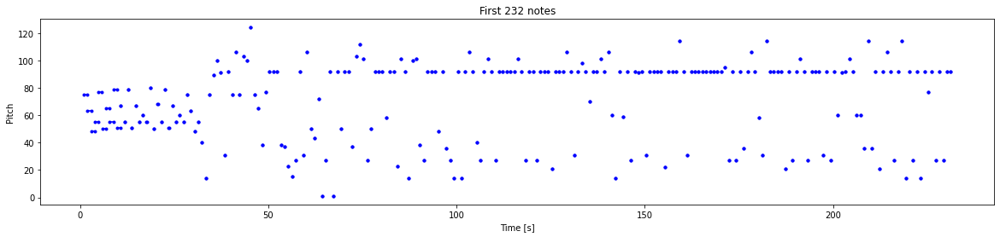

In [ ]:
plot_piano_roll(raw_notes,232)

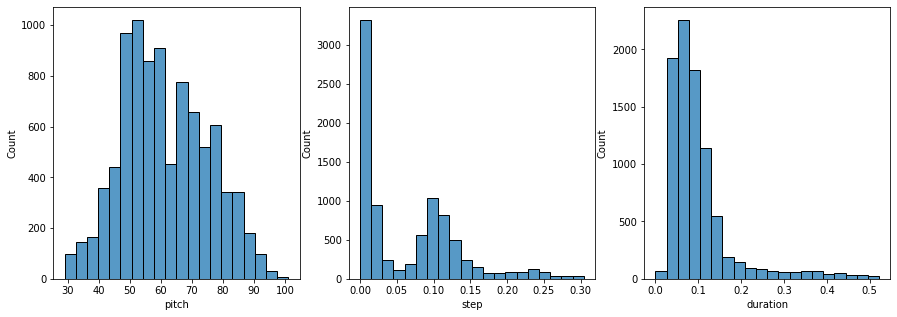

In [ ]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
    plt.figure(figsize=[15, 5])
    plt.subplot(1, 3, 1)
    sns.histplot(notes, x="pitch", bins=20)

    plt.subplot(1, 3, 2)
    max_step = np.percentile(notes['step'], 100 - drop_percentile)
    sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))
    
    plt.subplot(1, 3, 3)
    max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
    sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))

plot_distributions(raw_noteseed)

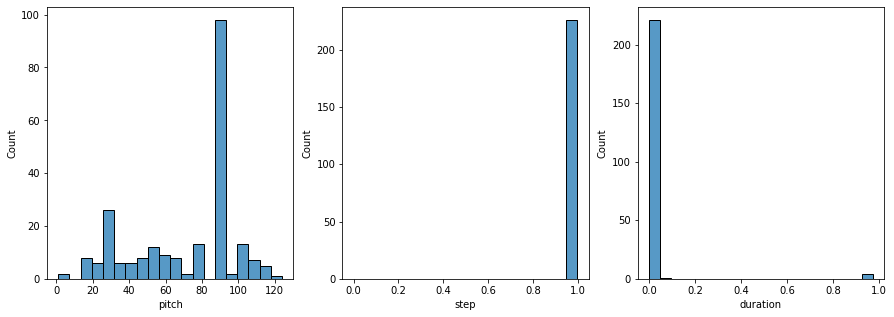

In [ ]:
plot_distributions(raw_notes)

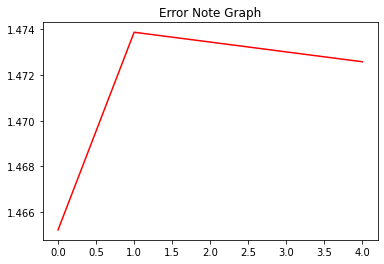

In [ ]:
x = np.arange(0, len(nnNotHot.LNote))
plt.title("Error Note Graph")
plt.plot(x, nnNotHot.LNote, color="red")

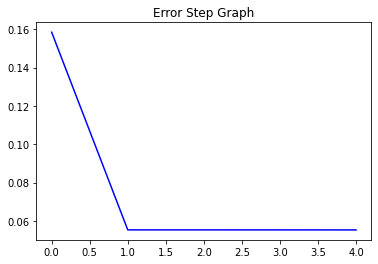

In [ ]:
y = np.arange(0, len(nnNotHot.LStep))
plt.title("Error Step Graph")
plt.plot(y, nnNotHot.LStep, color="blue")

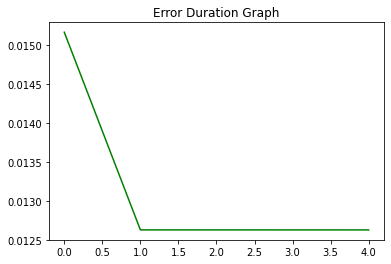

In [ ]:
z = np.arange(0, len(nnNotHot.LDura))
plt.title("Error Duration Graph")
plt.plot(z, nnNotHot.LDura, color="green")
plt.show()

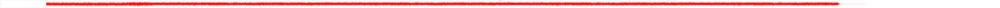

In [ ]:
plt.figure(figsize=(700,5))
a = np.arange(0, len(nnNotHot.MNote))
plt.title("Error Note Graph")
plt.plot(a, nnNotHot.MNote, color="red")

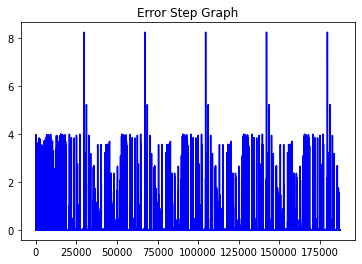

In [ ]:
b = np.arange(0, len(nnNotHot.MStep))
plt.title("Error Step Graph")
plt.plot(b, nnNotHot.MStep, color="blue")

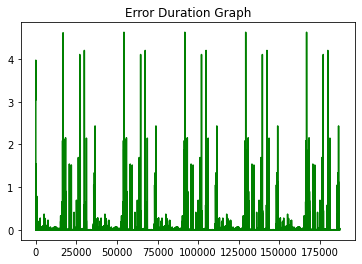

In [ ]:
c = np.arange(0, len(nnNotHot.MDura))
plt.title("Error Duration Graph")
plt.plot(c, nnNotHot.MDura, color="green")
plt.show()

In [ ]:
example_file = 'example_file.midi'
example_pm = notes_to_midi(
    raw_notes, out_file=example_file, instrument_name=instrument_name)

In [ ]:
display_audio(example_pm)